In [ ]:
!pip install viser

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.1/108.1 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.4/15.4 MB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.3/210.3 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 704.8/704.8 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.1/112.1 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.2/168.2 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.0/17.0 MB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 543.2/543.2 kB 28.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

EPOCHS = 1000
IMAGE_HEIGHT = 200
IMAGE_WIDTH = 200
SAMPLES = 10

cuda


In [ ]:
img = Image.open("180_image.jpg").convert('RGB')
transform = transforms.Compose([
    transforms.ToTensor(),
])
img = transform(img)
img = torch.permute(img, (1, 2, 0))

FileNotFoundError: [Errno 2] No such file or directory: '/content/180_image.jpg'

In [ ]:
print(img.shape)
h, w, c = img.shape
print(h, w, c)

torch.Size([1536, 2304, 3])
1536 2304 3


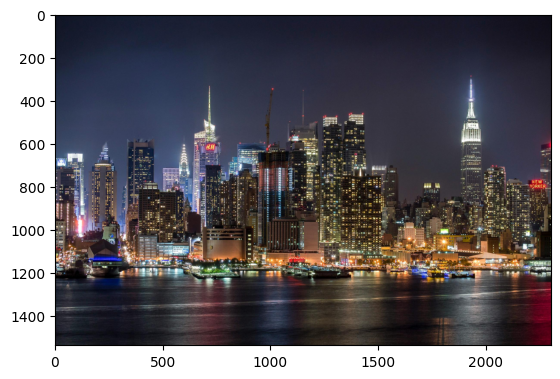

In [ ]:
plt.imshow(img.numpy())
plt.show()

In [ ]:
class PositionalEncoding:
    def __init__(self, L=10):
        self.L = L

    def __call__(self, coords):
        # coords: (N, 2) normalized coordinates in [0, 1]
        # Output: (N, 2 + 2*2*L)

        x = coords[:, 0:1]  # (N,1)
        y = coords[:, 1:2]

        # original coordinates
        out = [x, y]

        # frequency bands: [2^0, 2^1, ..., 2^{L-1}]
        for i in range(self.L):
            freq = 2.0**i * np.pi
            # sin and cos for x
            out.append(torch.sin(freq * x))
            out.append(torch.cos(freq * x))
            # sin and cos for y
            out.append(torch.sin(freq * y))
            out.append(torch.cos(freq * y))

        return torch.cat(out, dim=-1)


In [ ]:
class ImageDataset(Dataset):
    def __init__(self, img_tensor, batch_size=10000):
        # img_tensor: [H, W, 3], values in [0,255]
        self.img = img_tensor.float()  # normalize to [0,1]
        self.H, self.W = self.img.shape[:2]
        self.batch_size = batch_size

        # create a meshgrid of coordinates
        ys, xs = torch.meshgrid(
            torch.linspace(0, self.H-1, self.H),
            torch.linspace(0, self.W-1, self.W)
        )
        self.xs = xs / (self.W - 1)
        self.ys = ys / (self.H - 1)

    def __len__(self):
        # Since we sample randomly each time, we can make this arbitrarily large.
        # We'll just return a large number or 1 if we only need one pass.
        return 100000  # a large number to allow multiple epochs if needed

    def __getitem__(self, idx):
        # sample random pixels
        idxs = torch.randint(0, self.H*self.W, (self.batch_size,))
        # convert linear idx to 2D
        xs = self.xs.view(-1)[idxs]
        ys = self.ys.view(-1)[idxs]

        coords = torch.stack([xs, ys], dim=-1)  # (N,2)
        colors = self.img.view(-1, 3)[idxs]     # (N,3)
        return coords, colors


In [ ]:
batch_size = 10000
dataset = ImageDataset(img, batch_size=batch_size)
loader = DataLoader(dataset, batch_size=None, shuffle=False)  # batch_size=None to let Dataset handle it


NameError: name 'img' is not defined

In [ ]:
class MLP(nn.Module):
    def __init__(self, in_dim=42, hidden_dim=256, out_dim=3):
        super(MLP, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, out_dim),
            nn.Sigmoid()  # output in [0,1]
        )

    def forward(self, x):
        return self.net(x)

In [ ]:
L = 10
pe = PositionalEncoding(L=L)
model = MLP(in_dim=2 + 4*L, hidden_dim=256, out_dim=3).to(device)

optimizer = optim.Adam(model.parameters(), lr=1e-2)
criterion = nn.MSELoss()

In [ ]:
def train_with_hyperparameter_tuning(
    pe, model_class, loader, criterion, device, learning_rates, num_iters=2000, hidden_dim=256, L=10
):
    """
    Train the model with different learning rates and track PSNR values for each.

    Parameters:
    - pe: Positional Encoding function
    - model_class: The MLP model class to instantiate
    - loader: DataLoader providing (coordinates, ground truth colors)
    - criterion: Loss function (e.g., MSELoss)
    - device: Device to run the training on (e.g., 'cuda' or 'cpu')
    - learning_rates: List of learning rates to try
    - num_iters: Number of training iterations
    - hidden_dim: Hidden dimension for the MLP
    - L: Maximum frequency for Positional Encoding

    Returns:
    - results: Dictionary with learning rates as keys and PSNR value lists as values
    """
    results = {}

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # Reinitialize model and optimizer for each learning rate
        model = model_class(in_dim=2 + 4 * L, hidden_dim=hidden_dim, out_dim=3).to(device)
        optimizer = optim.Adam(model.parameters(), lr=lr)

        psnr_values = []

        for i, (coords, gt_colors) in enumerate(loader):
            if i >= num_iters:
                break

            coords = coords.to(device)       # (N,2)
            gt_colors = gt_colors.to(device) # (N,3)

            # Positional Encoding
            pe_coords = pe(coords)

            # Forward pass
            pred_colors = model(pe_coords)

            # Loss computation
            loss = criterion(pred_colors, gt_colors)

            # Backpropagation and optimizer step
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Compute PSNR
            mse_val = loss.item()
            psnr_val = 10 * np.log10(1.0 / mse_val)
            psnr_values.append(psnr_val)

            if (i + 1) % 100 == 0:
                print(f"Iter {i+1}/{num_iters}, LR: {lr}, MSE: {mse_val:.4f}, PSNR: {psnr_val:.2f}")

        results[lr] = psnr_values

    return results

# Example usage:
# Assuming `loader`, `pe`, and `device` are already set up.
# learning_rates = [1e-3, 1e-2, 5e-2]
# results = train_with_hyperparameter_tuning(pe, MLP, loader, criterion, device, learning_rates)

# You can then plot the results as PSNR vs iterations for each learning rate. Let me know if you'd like that!


In [ ]:
def train_and_visualize(
    pe, model_class, loader, criterion, device, lr=1e-2, num_iters=2000, hidden_dim=256, L=10, h=256, w=256
):
    """
    Train the model and visualize the predicted images across iterations.

    Parameters:
    - pe: Positional Encoding function
    - model_class: The MLP model class to instantiate
    - loader: DataLoader providing (coordinates, ground truth colors)
    - criterion: Loss function (e.g., MSELoss)
    - device: Device to run the training on (e.g., 'cuda' or 'cpu')
    - lr: Learning rate
    - num_iters: Number of training iterations
    - hidden_dim: Hidden dimension for the MLP
    - L: Maximum frequency for Positional Encoding
    - h, w: Dimensions of the image

    Returns:
    - psnr_values: List of PSNR values over iterations
    """
    model = model_class(in_dim=2 + 4 * L, hidden_dim=hidden_dim, out_dim=3).to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)

    psnr_values = []

    # Pixel grid for the entire image
    coords = np.stack(np.meshgrid(np.arange(w), np.arange(h)), axis=-1).reshape(-1, 2)
    coords = torch.tensor(coords / np.array([w, h]), dtype=torch.float32).to(device)  # Normalize and send to device
    pe_coords = pe(coords)  # Apply positional encoding

    for i, (batch_coords, gt_colors) in enumerate(loader):
        if i >= num_iters:
            break

        batch_coords = batch_coords.to(device)
        gt_colors = gt_colors.to(device)

        # Positional Encoding
        batch_pe_coords = pe(batch_coords)

        # Forward pass
        pred_colors = model(batch_pe_coords)

        # Loss computation
        loss = criterion(pred_colors, gt_colors)

        # Backpropagation and optimizer step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Compute PSNR
        mse_val = loss.item()
        psnr_val = 10 * np.log10(1.0 / mse_val)
        psnr_values.append(psnr_val)

        # Visualization of the image reconstruction across iterations
        if (i + 1) % 100 == 0 or i == num_iters - 1:
            with torch.no_grad():
                full_pred_colors = model(pe_coords).cpu().numpy().reshape(h, w, 3)  # Reconstruct image

            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.title(f"Iteration {i + 1}")
            plt.imshow(full_pred_colors.clip(0, 1))  # Clip values to [0, 1]
            plt.axis("off")

            plt.subplot(1, 2, 2)
            plt.title("Ground Truth")
            plt.imshow(img)  # Assuming `image` is the ground truth
            plt.axis("off")

            plt.show()

        if (i + 1) % 100 == 0:
            print(f"Iter {i+1}/{num_iters}, LR: {lr}, MSE: {mse_val:.4f}, PSNR: {psnr_val:.2f}")

    return psnr_values


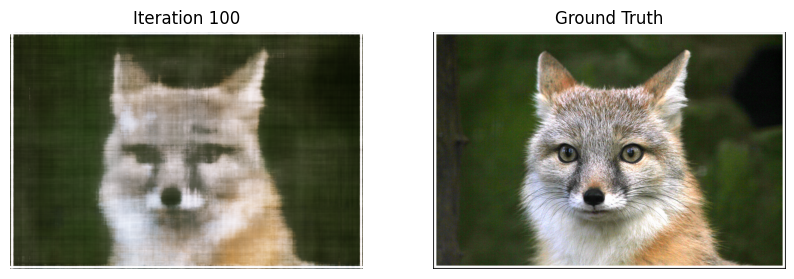

Iter 100/2000, LR: 0.01, MSE: 0.0053, PSNR: 22.75


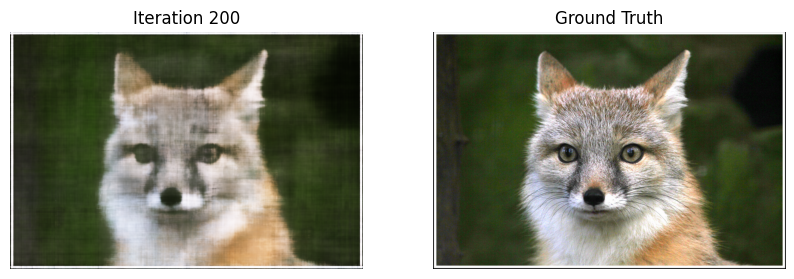

Iter 200/2000, LR: 0.01, MSE: 0.0037, PSNR: 24.33


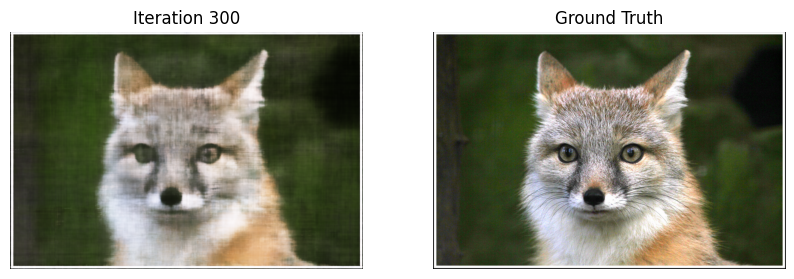

Iter 300/2000, LR: 0.01, MSE: 0.0034, PSNR: 24.72


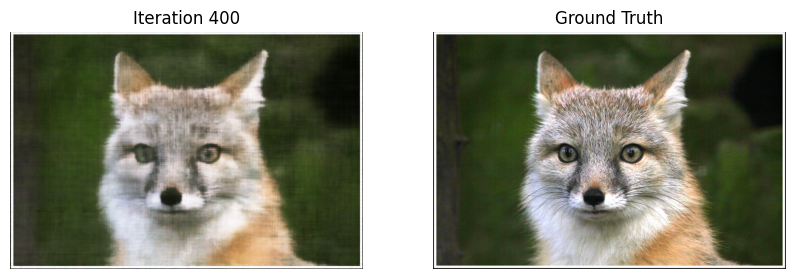

Iter 400/2000, LR: 0.01, MSE: 0.0031, PSNR: 25.05


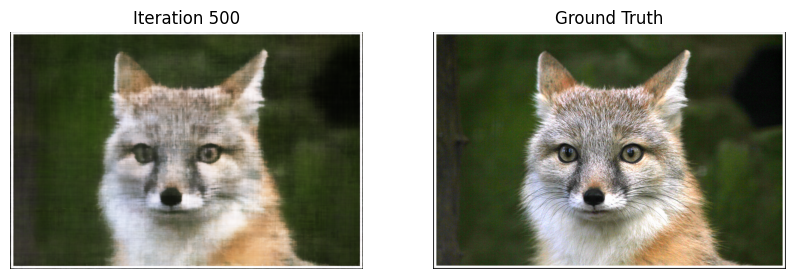

Iter 500/2000, LR: 0.01, MSE: 0.0031, PSNR: 25.07


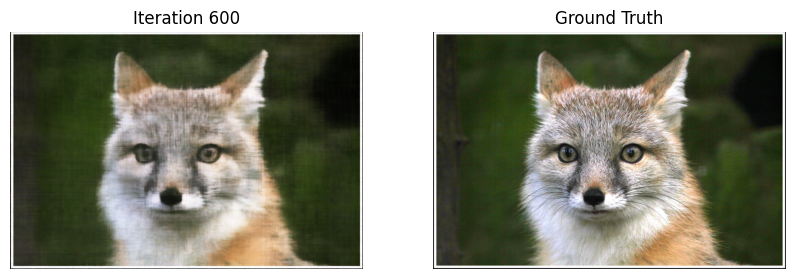

Iter 600/2000, LR: 0.01, MSE: 0.0030, PSNR: 25.26


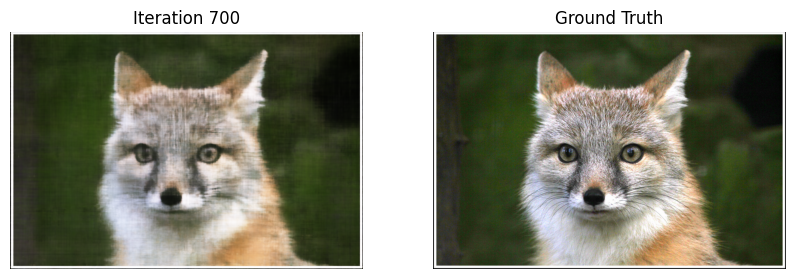

Iter 700/2000, LR: 0.01, MSE: 0.0028, PSNR: 25.59


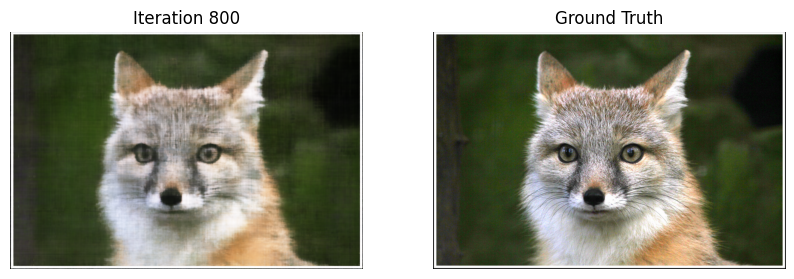

Iter 800/2000, LR: 0.01, MSE: 0.0027, PSNR: 25.65


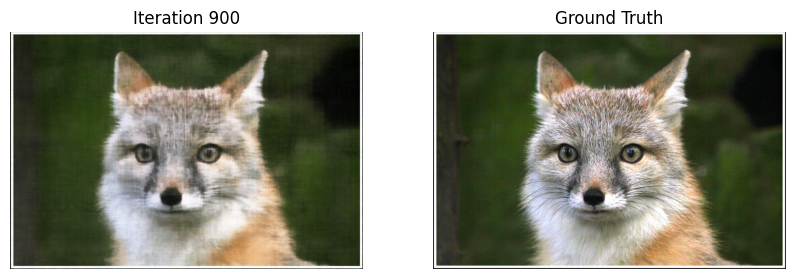

Iter 900/2000, LR: 0.01, MSE: 0.0027, PSNR: 25.65


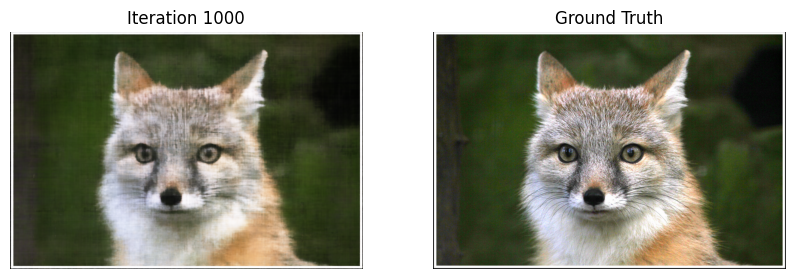

Iter 1000/2000, LR: 0.01, MSE: 0.0027, PSNR: 25.62


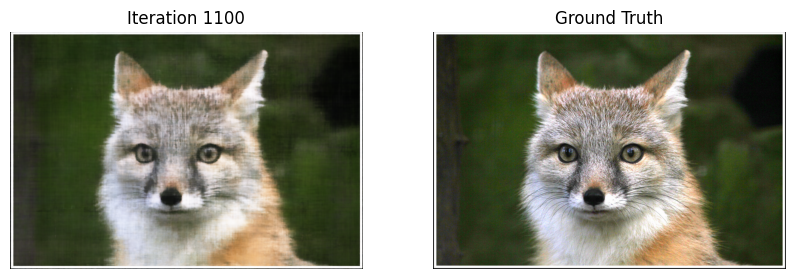

Iter 1100/2000, LR: 0.01, MSE: 0.0025, PSNR: 25.97


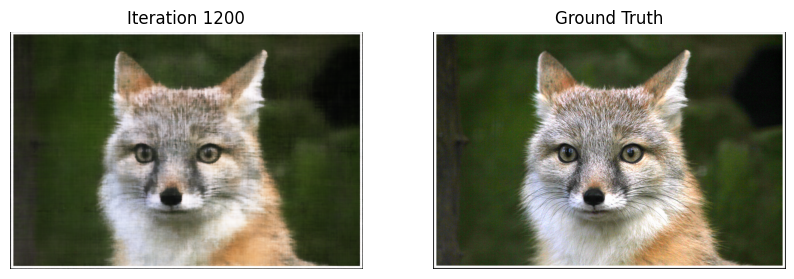

Iter 1200/2000, LR: 0.01, MSE: 0.0026, PSNR: 25.78


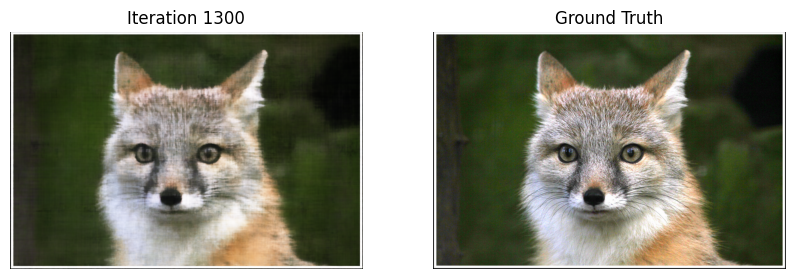

Iter 1300/2000, LR: 0.01, MSE: 0.0027, PSNR: 25.71


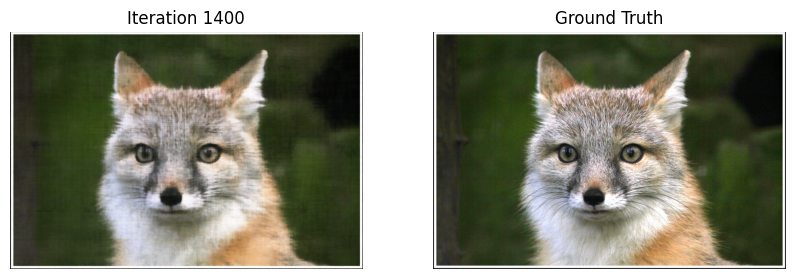

Iter 1400/2000, LR: 0.01, MSE: 0.0026, PSNR: 25.86


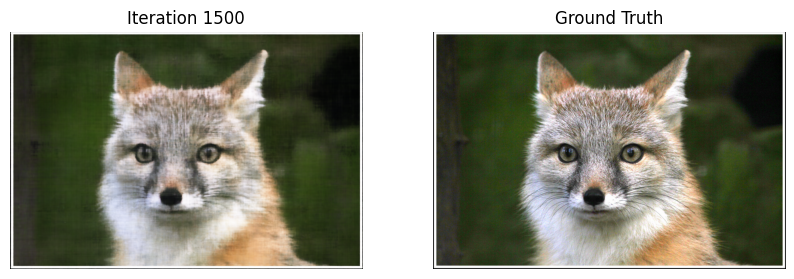

Iter 1500/2000, LR: 0.01, MSE: 0.0024, PSNR: 26.16


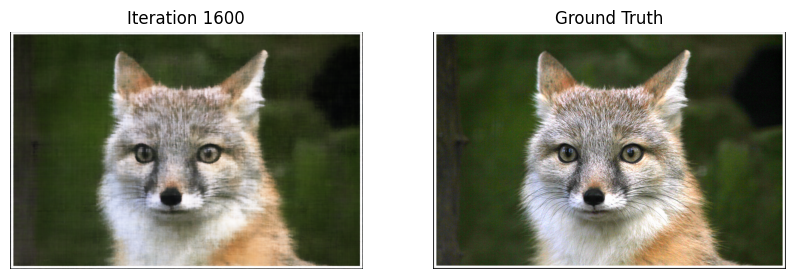

Iter 1600/2000, LR: 0.01, MSE: 0.0025, PSNR: 25.94


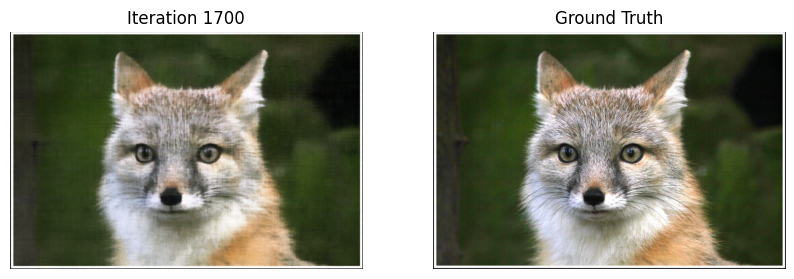

Iter 1700/2000, LR: 0.01, MSE: 0.0025, PSNR: 26.11


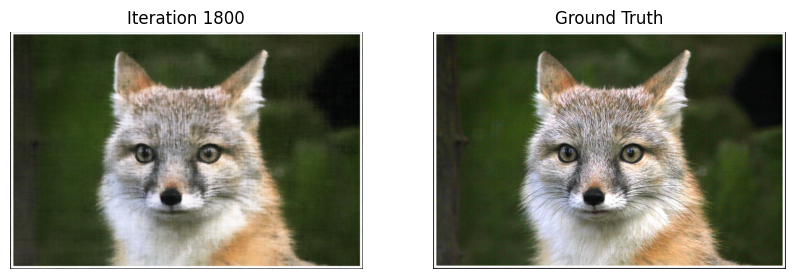

Iter 1800/2000, LR: 0.01, MSE: 0.0022, PSNR: 26.55


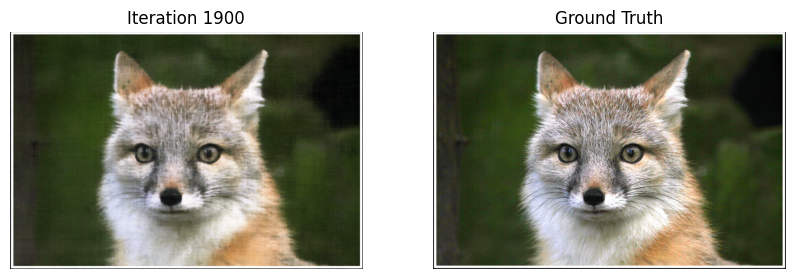

Iter 1900/2000, LR: 0.01, MSE: 0.0023, PSNR: 26.37


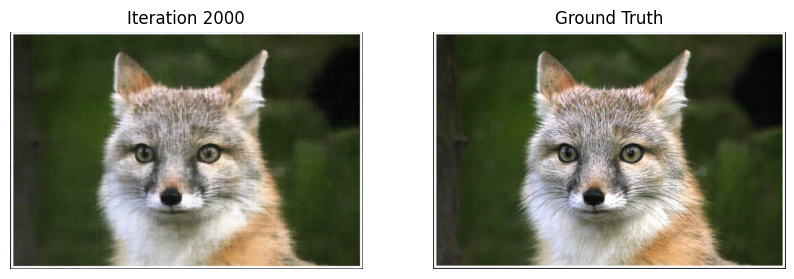

Iter 2000/2000, LR: 0.01, MSE: 0.0024, PSNR: 26.28


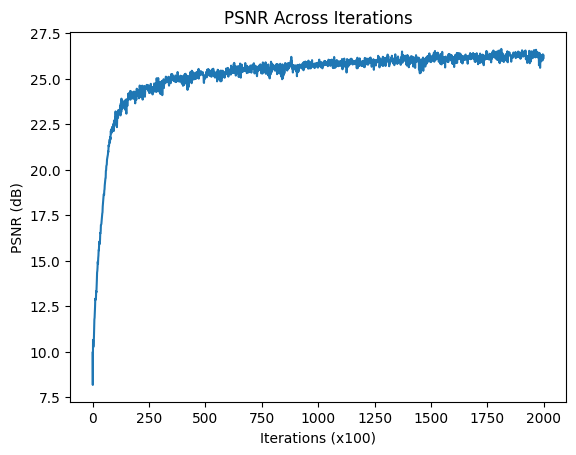

In [ ]:
learning_rates = [1e-3, 1e-2, 5e-2]

results = train_with_hyperparameter_tuning(
    pe=pe,
    model_class=MLP,
    loader=loader,
    criterion=criterion,
    device=device,
    learning_rates=learning_rates,
    num_iters=2000,
    hidden_dim=256,
    L=10
)

psnr_values = train_and_visualize(
    pe=pe,
    model_class=MLP,
    loader=loader,
    criterion=criterion,
    device=device,
    lr=1e-2,
    num_iters=2000,
    hidden_dim=256,
    L=10,
    h=h,
    w=w
)

# Optionally, plot the PSNR curve
plt.plot(psnr_values)
plt.title("PSNR Across Iterations")
plt.xlabel("Iterations (x100)")
plt.ylabel("PSNR (dB)")
plt.show()


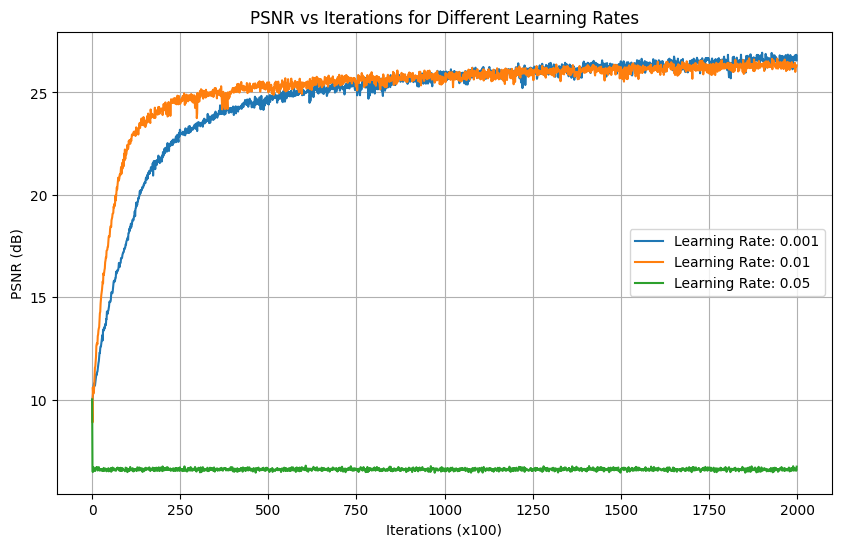

In [ ]:
plt.figure(figsize=(10, 6))
for lr, psnr_values in results.items():
    plt.plot(psnr_values, label=f"Learning Rate: {lr}")

plt.title("PSNR vs Iterations for Different Learning Rates")
plt.xlabel("Iterations (x100)")
plt.ylabel("PSNR (dB)")
plt.legend()
plt.grid()
plt.show()

In [ ]:
def train_with_L_variation(
    L_values, model_class, loader, criterion, device, lr=1e-2, num_iters=2000, hidden_dim=256, h=256, w=256
):
    """
    Train the model with different L values (frequency levels in positional encoding)
    and track PSNR values for each L.
    """
    results = {}

    for L in L_values:
        print(f"Training with L: {L}")

        # Initialize Positional Encoding with the current L value
        pe = PositionalEncoding(L)

        # Initialize model
        model = model_class(in_dim=2 + 4 * L, hidden_dim=hidden_dim, out_dim=3).to(device)
        optimizer = optim.Adam(model.parameters(), lr=lr)

        psnr_values = []

        # Full grid of pixel coordinates for visualization
        coords = np.stack(np.meshgrid(np.arange(w), np.arange(h)), axis=-1).reshape(-1, 2)
        coords = torch.tensor(coords / np.array([w, h]), dtype=torch.float32).to(device)  # Normalize
        pe_coords = pe(coords)  # Apply positional encoding for the entire image

        for i, (batch_coords, gt_colors) in enumerate(loader):
            if i >= num_iters:
                break

            batch_coords = batch_coords.to(device)
            gt_colors = gt_colors.to(device)

            # Apply positional encoding
            batch_pe_coords = pe(batch_coords)

            # Forward pass
            pred_colors = model(batch_pe_coords)

            # Loss computation
            loss = criterion(pred_colors, gt_colors)

            # Backpropagation and optimizer step
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Compute PSNR
            mse_val = loss.item()
            psnr_val = 10 * np.log10(1.0 / mse_val)
            psnr_values.append(psnr_val)

            # Visualization at specific intervals
            if (i + 1) % 500 == 0 or i == num_iters - 1:
                with torch.no_grad():
                    full_pred_colors = model(pe_coords).cpu().numpy().reshape(h, w, 3)  # Reconstruct image

                plt.figure(figsize=(10, 5))
                plt.subplot(1, 2, 1)
                plt.title(f"Reconstructed Image (L={L}, Iter={i + 1})")
                plt.imshow(full_pred_colors.clip(0, 1))  # Clip values to [0, 1]
                plt.axis("off")

                plt.subplot(1, 2, 2)
                plt.title("Ground Truth")
                plt.imshow(img)  # Assuming `image` is the ground truth
                plt.axis("off")

                plt.show()

            if (i + 1) % 100 == 0:
                print(f"Iter {i+1}/{num_iters}, L: {L}, MSE: {mse_val:.4f}, PSNR: {psnr_val:.2f}")

        results[L] = psnr_values

    return results



Training with L: 5
Iter 100/2000, L: 5, MSE: 0.0138, PSNR: 18.61
Iter 200/2000, L: 5, MSE: 0.0059, PSNR: 22.27
Iter 300/2000, L: 5, MSE: 0.0047, PSNR: 23.27
Iter 400/2000, L: 5, MSE: 0.0039, PSNR: 24.14


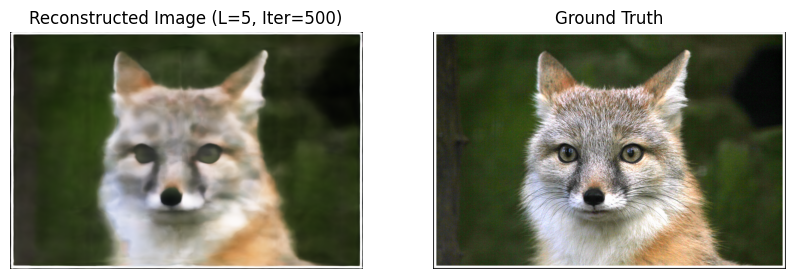

Iter 500/2000, L: 5, MSE: 0.0040, PSNR: 24.03
Iter 600/2000, L: 5, MSE: 0.0037, PSNR: 24.31
Iter 700/2000, L: 5, MSE: 0.0034, PSNR: 24.72
Iter 800/2000, L: 5, MSE: 0.0039, PSNR: 24.14
Iter 900/2000, L: 5, MSE: 0.0031, PSNR: 25.04


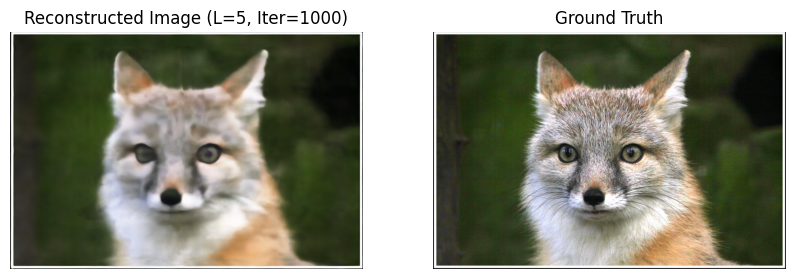

Iter 1000/2000, L: 5, MSE: 0.0032, PSNR: 24.99
Iter 1100/2000, L: 5, MSE: 0.0034, PSNR: 24.71
Iter 1200/2000, L: 5, MSE: 0.0031, PSNR: 25.12
Iter 1300/2000, L: 5, MSE: 0.0031, PSNR: 25.09
Iter 1400/2000, L: 5, MSE: 0.0032, PSNR: 24.98


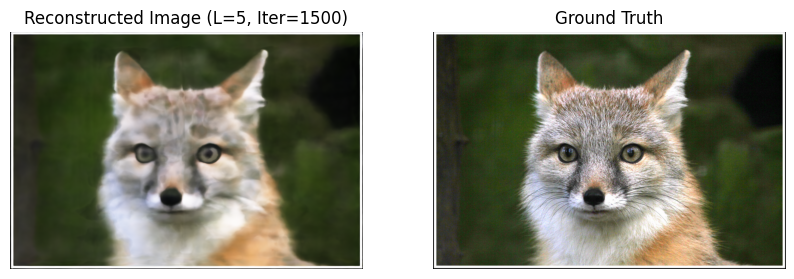

Iter 1500/2000, L: 5, MSE: 0.0031, PSNR: 25.03
Iter 1600/2000, L: 5, MSE: 0.0030, PSNR: 25.19
Iter 1700/2000, L: 5, MSE: 0.0029, PSNR: 25.31
Iter 1800/2000, L: 5, MSE: 0.0029, PSNR: 25.31
Iter 1900/2000, L: 5, MSE: 0.0034, PSNR: 24.69


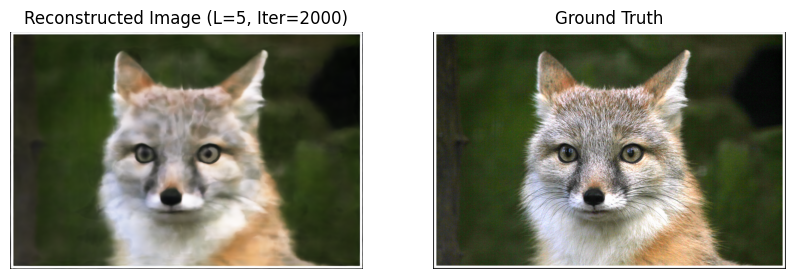

Iter 2000/2000, L: 5, MSE: 0.0031, PSNR: 25.10
Training with L: 10
Iter 100/2000, L: 10, MSE: 0.0056, PSNR: 22.49
Iter 200/2000, L: 10, MSE: 0.0038, PSNR: 24.25
Iter 300/2000, L: 10, MSE: 0.0033, PSNR: 24.83
Iter 400/2000, L: 10, MSE: 0.0029, PSNR: 25.33


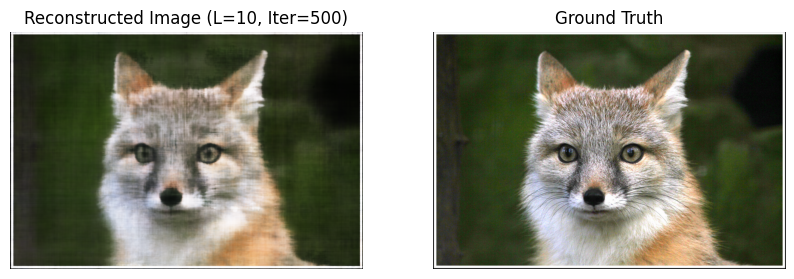

Iter 500/2000, L: 10, MSE: 0.0029, PSNR: 25.41
Iter 600/2000, L: 10, MSE: 0.0029, PSNR: 25.42
Iter 700/2000, L: 10, MSE: 0.0030, PSNR: 25.20
Iter 800/2000, L: 10, MSE: 0.0027, PSNR: 25.66
Iter 900/2000, L: 10, MSE: 0.0026, PSNR: 25.86


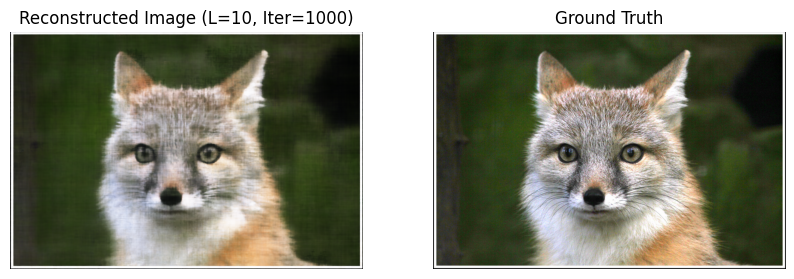

Iter 1000/2000, L: 10, MSE: 0.0026, PSNR: 25.93
Iter 1100/2000, L: 10, MSE: 0.0026, PSNR: 25.93
Iter 1200/2000, L: 10, MSE: 0.0025, PSNR: 26.09
Iter 1300/2000, L: 10, MSE: 0.0024, PSNR: 26.20
Iter 1400/2000, L: 10, MSE: 0.0025, PSNR: 26.03


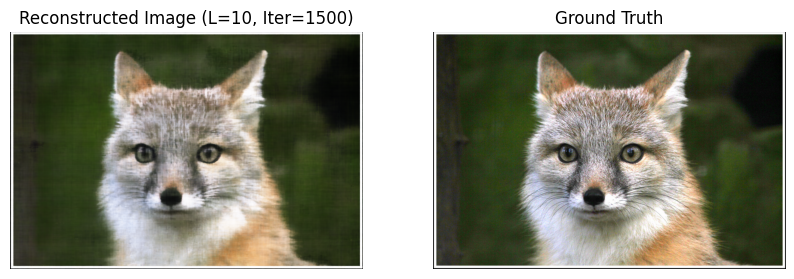

Iter 1500/2000, L: 10, MSE: 0.0024, PSNR: 26.18
Iter 1600/2000, L: 10, MSE: 0.0024, PSNR: 26.23
Iter 1700/2000, L: 10, MSE: 0.0024, PSNR: 26.22
Iter 1800/2000, L: 10, MSE: 0.0024, PSNR: 26.22
Iter 1900/2000, L: 10, MSE: 0.0024, PSNR: 26.12


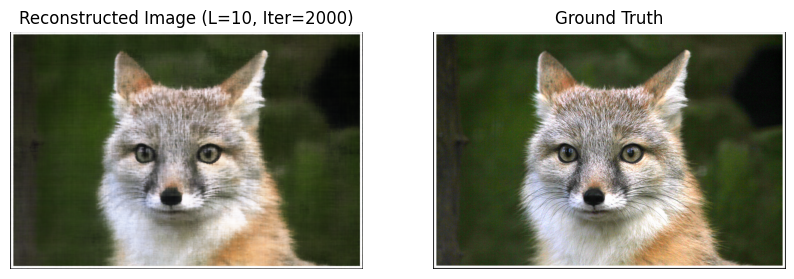

Iter 2000/2000, L: 10, MSE: 0.0022, PSNR: 26.59
Training with L: 15
Iter 100/2000, L: 15, MSE: 0.0061, PSNR: 22.14
Iter 200/2000, L: 15, MSE: 0.0038, PSNR: 24.21
Iter 300/2000, L: 15, MSE: 0.0032, PSNR: 24.93
Iter 400/2000, L: 15, MSE: 0.0032, PSNR: 24.89


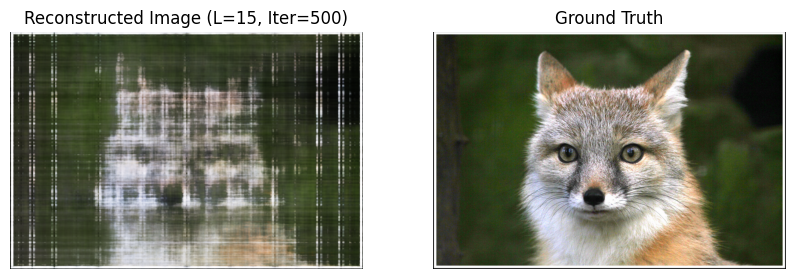

Iter 500/2000, L: 15, MSE: 0.0030, PSNR: 25.23
Iter 600/2000, L: 15, MSE: 0.0026, PSNR: 25.78
Iter 700/2000, L: 15, MSE: 0.0027, PSNR: 25.62
Iter 800/2000, L: 15, MSE: 0.0026, PSNR: 25.88
Iter 900/2000, L: 15, MSE: 0.0026, PSNR: 25.91


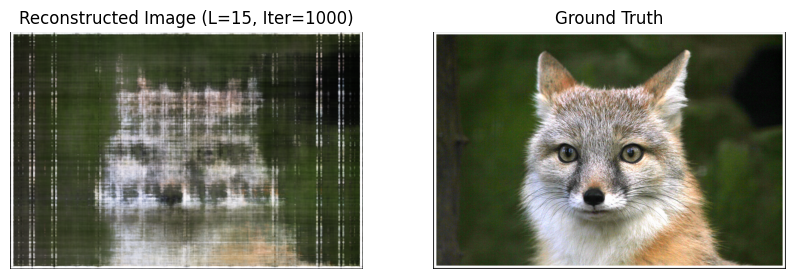

Iter 1000/2000, L: 15, MSE: 0.0027, PSNR: 25.75
Iter 1100/2000, L: 15, MSE: 0.0025, PSNR: 25.99
Iter 1200/2000, L: 15, MSE: 0.0024, PSNR: 26.24
Iter 1300/2000, L: 15, MSE: 0.0024, PSNR: 26.25
Iter 1400/2000, L: 15, MSE: 0.0024, PSNR: 26.22


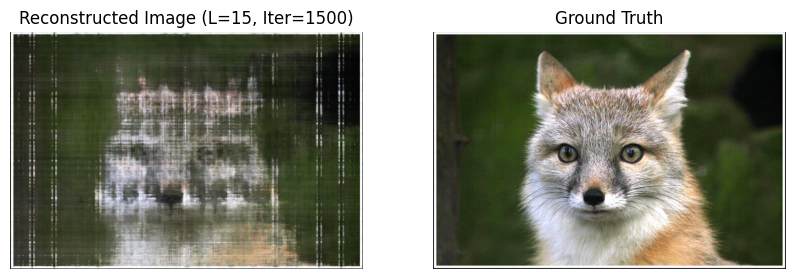

Iter 1500/2000, L: 15, MSE: 0.0023, PSNR: 26.32
Iter 1600/2000, L: 15, MSE: 0.0023, PSNR: 26.43
Iter 1700/2000, L: 15, MSE: 0.0023, PSNR: 26.47
Iter 1800/2000, L: 15, MSE: 0.0022, PSNR: 26.50
Iter 1900/2000, L: 15, MSE: 0.0021, PSNR: 26.74


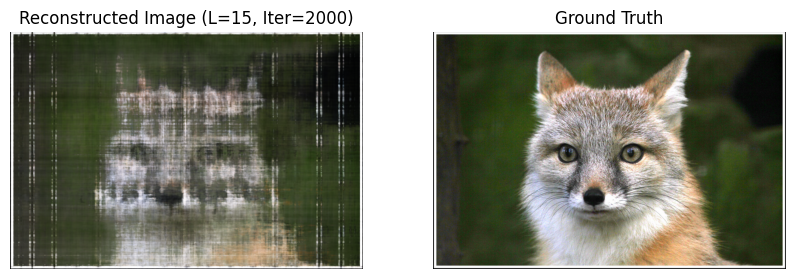

Iter 2000/2000, L: 15, MSE: 0.0022, PSNR: 26.64


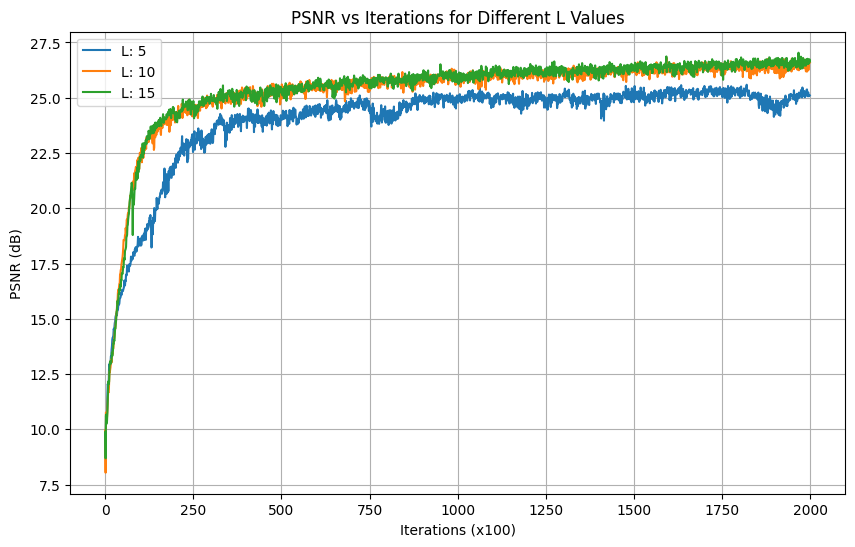

In [ ]:
# Example usage:
L_values = [5, 10, 15]  # Different L values to try
results = train_with_L_variation(
    L_values=L_values,
    model_class=MLP,
    loader=loader,
    criterion=criterion,
    device=device,
    lr=1e-2,
    num_iters=2000,
    hidden_dim=256,
    h=h,
    w=w
)

# Plot PSNR for different L values
plt.figure(figsize=(10, 6))
for L, psnr_values in results.items():
    plt.plot(psnr_values, label=f"L: {L}")

plt.title("PSNR vs Iterations for Different L Values")
plt.xlabel("Iterations (x100)")
plt.ylabel("PSNR (dB)")
plt.legend()
plt.grid()
plt.show()


In [ ]:
!pip install tensordict

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.9/359.9 kB 27.6 MB/s eta 0:00:00


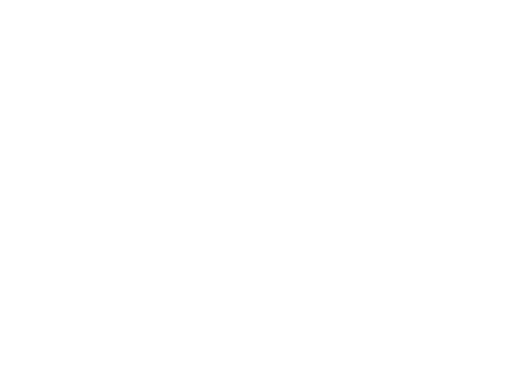

In [ ]:
import base64
import io
import itertools
import math
import numpy as np
import scipy as sc
import skimage as sk
import skimage.io as skio
import skimage.transform as sktr
import cv2
import random
import torch
import torch.nn as nn
import torch.nn.functional as Fn
import torch.utils as ptu
import torch.optim as optim
from tensordict import TensorDict
import tensorflow as tf
import json
from PIL import Image, ExifTags
from typing import *
from matplotlib import pyplot as plt
from IPython.display import HTML
from IPython import display as ipythondisplay
import itertools
import os

dev_type = 'cuda'

plt.axis('off')
torch.set_default_dtype(torch.double)

In [ ]:
data = np.load("lego_200x200.npz")

# Training images: [100, 200, 200, 3]
images_train = torch.tensor(data["images_train"] / 255.0)

# Cameras for the training images
# (camera-to-world transformation matrix): [100, 4, 4]
c2ws_train = torch.tensor(data["c2ws_train"])

# Validation images:
images_val = torch.tensor(data["images_val"] / 255.0)

# Cameras for the validation images
# (camera-to-world transformation matrix): [10, 4, 4]
c2ws_val = torch.tensor(data["c2ws_val"])

# Test cameras for novel-view video rendering:
# (camera-to-world transformation matrix): [60, 4, 4]
c2ws_test = torch.tensor(data["c2ws_test"])

# Camera focal length
f = float(data["focal"])  # float

H, W = images_train.shape[1:3]
K = torch.Tensor([
    [f, 0, H / 2],
    [0, f, W / 2],
    [0, 0, 1]
])


In [ ]:
def transform(
    M: torch.Tensor,
    x: torch.Tensor
) -> torch.Tensor:
    batch_shape = x.shape[:-1]
    device = x.device

    augmented_x = torch.cat([x, torch.ones((*batch_shape, 1), device=device)], dim=-1)
    transformed_x = (M[..., :3, :] @ augmented_x.unsqueeze(-1)).squeeze(-1)
    return transformed_x


def pixel_to_camera(
    K_invT: torch.Tensor,
    uv: torch.Tensor
) -> torch.Tensor:
    batch_shape = uv.shape[:-1]
    device = uv.device

    augmented_uv = torch.cat([uv, torch.ones((*batch_shape, 1), device=device)], dim=-1)
    return augmented_uv @ K_invT


def pixel_to_ray(
    K_invT: torch.Tensor,
    c2w: torch.Tensor,
    uv: torch.Tensor
) -> Dict[str, torch.Tensor]:

    batch_shape = torch.broadcast_shapes(uv.shape[:-1], c2w.shape[:-2])
    device = uv.device

    r_o = c2w[..., :3, 3].expand(*batch_shape, 3)

    x_c = pixel_to_camera(K_invT, uv)
    x_w = transform(c2w, x_c)

    r_d = x_w - r_o
    r_d = r_d / torch.norm(r_d, dim=-1, keepdim=True)

    return {
        'origin': r_o,
        'direction': r_d
    }


In [ ]:
def sample_rays(
    ims: torch.Tensor,
    K_invT: torch.Tensor,
    c2ws: torch.Tensor,
    num_samples: int
) -> Dict[str, torch.Tensor]:

    num_images, height, width, _ = ims.shape
    device = ims.device

    h_indices = torch.randint(0, height, (num_samples // num_images,), device=device)
    w_indices = torch.randint(0, width, (num_samples // num_images,), device=device)

    c2w = c2ws[:, None]
    uv = torch.stack([w_indices, h_indices], dim=1)[None] + 0.5

    rays = pixel_to_ray(K_invT, c2w, uv)
    rays['rgb'] = ims[:, h_indices, w_indices]
    return rays


def sample_all_rays(
    ims: torch.Tensor,
    K_invT: torch.Tensor,
    c2ws: torch.Tensor
) -> Dict[str, torch.Tensor]:
    num_images, height, width, _ = ims.shape
    device = ims.device

    h_indices, w_indices = torch.meshgrid(
        torch.arange(height, device=device),
        torch.arange(width, device=device),
        indexing="ij"
    )

    c2w = c2ws[:, None, None]
    uv = torch.stack([w_indices, h_indices], dim=-1)[None] + 0.5

    rays = pixel_to_ray(K_invT, c2w, uv)
    rays['rgb'] = ims
    return rays


def sample_along_rays(
    rays: Dict[str, torch.Tensor],
    near: float = 2.0,
    far: float = 6.0,
    num_samples: int = 64,
    perturb: bool = False
) -> torch.Tensor:

    device = rays['origin'].device
    batch_shape = rays['origin'].shape[:-1]

    sample_interval = (far - near) / num_samples
    if perturb:
        t = torch.linspace(near, far - sample_interval, num_samples, device=device) + \
            torch.rand(num_samples, device=device) * sample_interval
    else:
        t = torch.linspace(near, far - sample_interval, num_samples, device=device)
    t = t.view(*(1 for _ in range(len(batch_shape))), num_samples, 1)

    sampled_points = rays['origin'].unsqueeze(-2) + t * rays['direction'].unsqueeze(-2)
    return sampled_points


In [ ]:

class RayDataset(object):
    def __init__(self, ims, K, c2ws, device):
        self.ims = ims.to(device)
        self.K = K.to(device)
        self.K_invT = torch.linalg.inv(self.K.T)
        self.c2ws = c2ws.to(device)

    def sample_rays(self, num_samples):
        return sample_rays(self.ims, self.K_invT, self.c2ws, num_samples)

    def sample_all_rays(self):
        return sample_all_rays(self.ims, self.K_invT, self.c2ws)

In [ ]:

class NeRF(nn.Module):
    def __init__(self, L: int = 10, L_r: int = 4) -> None:
        super().__init__()

        self.SPE = SinusoidalPositionalEmbedding(L)
        self.SPE_r = SinusoidalPositionalEmbedding(L_r)

        input_dim = 3 * (2 * L + 1)
        self.x_layers1 = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            *itertools.chain(*[
                (nn.Linear(256, 256), nn.ReLU()) for _ in range(3)
            ])
        )
        self.x_layers2 = nn.Sequential(
            nn.Linear(input_dim + 256, 256),
            *itertools.chain(*[
                (nn.ReLU(), nn.Linear(256, 256)) for _ in range(3)
            ])
        )

        self.density_layers = nn.Sequential(
            nn.Linear(256, 1),
            nn.ReLU()
        )

        self.rgb_fc = nn.Linear(256, 256)
        self.rgb_layers = nn.Sequential(
            nn.Linear(3 * (2 * L_r + 1) + 256, 128),
            nn.ReLU(),
            nn.Linear(128, 3),
            nn.Sigmoid()
        )

        self._initialize_weights()

    def _initialize_weights(self) -> None:
        layers_to_initialize = [
            self.x_layers1, self.x_layers2, self.density_layers, self.rgb_layers
        ]
        for layers in layers_to_initialize:
            for layer in layers[::2]:  # Access Linear layers only
                nn.init.kaiming_normal_(layer.weight)
                nn.init.zeros_(layer.bias)

        nn.init.constant_(self.density_layers[0].bias, 3)

    def forward(
        self,
        x: torch.Tensor,
        r_d: torch.Tensor
    ) -> torch.Tensor:
        self.to(x.device)

        spe_x = self.SPE(x)
        f = self.x_layers2(torch.cat([spe_x, self.x_layers1(spe_x)], dim=-1))

        density = self.density_layers(f)

        spe_r_d = self.SPE_r(r_d).expand(*(-1 for _ in range(r_d.ndim - 2)), x.shape[-2], -1)

        rgb_input = torch.cat([spe_r_d, self.rgb_fc(f)], dim=-1)
        rgb = self.rgb_layers(rgb_input)

        return density, rgb


In [ ]:
def volumetric_rendering(
    densities: torch.Tensor,
    colors: torch.Tensor,
    step_size: float,
) -> torch.Tensor:
    batch_shape = densities.shape[:-2]
    num_steps = densities.shape[-2]
    device = densities.device

    transmittance = torch.cat([
        torch.ones((*batch_shape, 1, 1), device=device),
        torch.exp(torch.cumsum(-step_size * densities[..., :-1, :], dim=-2))
    ], dim=-2)

    weights = transmittance * (1 - torch.exp(-densities * step_size))
    accumulated_colors = torch.sum(weights * colors, dim=-2)

    return accumulated_colors


In [ ]:
class SinusoidalPositionalEmbedding(nn.Module):
    def __init__(self, num_frequencies: int) -> None:
        super().__init__()
        self.frequencies = torch.pow(2, torch.arange(num_frequencies)) * torch.pi

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        device_frequencies = self.frequencies.to(x.device)
        positional_encoding = device_frequencies * x.unsqueeze(-1)
        cosine_terms = torch.cos(positional_encoding).reshape(*x.shape[:-1], -1)
        sine_terms = torch.sin(positional_encoding).reshape(*x.shape[:-1], -1)


        return torch.cat([x, cosine_terms, sine_terms], dim=-1)


In [ ]:
import os
import torch
import torch.optim as optim
import torch.nn.functional as Fn
import numpy as np
import matplotlib.pyplot as plt

def test3d(
    model: NeRF,
    rays: TensorDict,
    perturb: bool,
    num_samples: int = 64,
    near: float = 2.0,
    far: float = 6.0
) -> torch.Tensor:
    sample_points = sample_along_rays(
        rays, near=near, far=far, num_samples=num_samples, perturb=perturb
    )
    ray_directions = rays['direction'].unsqueeze(-2)
    step_size = (far - near) / num_samples

    return volumetric_rendering(*model(sample_points, ray_directions), step_size)


def train3d(
    model: NeRF,
    start_iter: int,
    end_iter: int,
    save_dir: str,
    log_frequency: int = 50,
    save_frequency: int = 50
):
    device = next(model.parameters()).device
    model.to(device)
    optimizer = optim.AdamW(model.parameters(), lr=5e-4)

    train_dataset = RayDataset(images_train, K, c2ws_train, device)
    valid_dataset = RayDataset(images_val, K, c2ws_val, device)

    batch_size, num_samples = 10000, 64
    near, far = 2.0, 6.0
    step_size = (far - near) / num_samples

    training_loss, validation_loss, rendered_images = [], [], []

    for iteration in range(start_iter, end_iter + 1):

        model.train()
        with torch.set_grad_enabled(True):
            train_rays = train_dataset.sample_rays(batch_size)
            train_loss = Fn.mse_loss(test3d(model, train_rays, perturb=True), train_rays['rgb'])

        if iteration % log_frequency == 0:
            model.eval()
            with torch.no_grad():
                val_idx = np.random.randint(len(images_val))
                valid_rays = valid_dataset.sample_all_rays()[val_idx]
                rendered_image = render_im(model, valid_rays).cpu()
                validation_loss_value = Fn.mse_loss(rendered_image, images_val[val_idx])

                print(
                    f"Iteration {iteration}: "
                    f"Training Loss = {train_loss.item():.4f}, "
                    f"Validation Loss = {validation_loss_value.item():.4f}"
                )
                training_loss.append(train_loss.item())
                validation_loss.append(validation_loss_value.item())
                rendered_images.append(rendered_image)

                plt.imshow(torch.cat([rendered_image, images_val[val_idx]], dim=1))
                plt.show()

        if iteration % save_frequency == 0:
            torch.save(model.state_dict(), f'{iteration}.pt')
            torch.save(optimizer.state_dict(), f'optim.pt')

        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()

        del train_loss, train_rays
        torch.cuda.empty_cache()

    return torch.tensor(training_loss), torch.tensor(validation_loss)


In [ ]:
def render_image(
    model: NeRF,
    rays: TensorDict,
    background: torch.Tensor = None,
    num_samples: int = 64,
    near: float = 2.0,
    far: float = 6.0,
    chunk_size: int = 3
) -> torch.Tensor:

    device = rays.device
    height, width = rays.shape[:2]

    sampled_points = sample_along_rays(
        rays, near=near, far=far, num_samples=num_samples
    )
    ray_directions = rays['direction'].unsqueeze(-2)

    h_step, w_step = (height + chunk_size - 1) // chunk_size, (width + chunk_size - 1) // chunk_size

    rendered_image = torch.empty((height, width, 3), dtype=torch.float32, device=device)

    with torch.no_grad():
        for h_start in range(0, height, h_step):
            h_indices = torch.arange(h_start, min(height, h_start + h_step), device=device)[:, None]
            for w_start in range(0, width, w_step):
                w_indices = torch.arange(w_start, min(width, w_start + w_step), device=device)[None]

                rendered_image[h_indices, w_indices] = volumetric_rendering(
                    *model(
                        sampled_points[h_indices, w_indices],
                        ray_directions[h_indices, w_indices]
                    ),
                    step_size=(far - near) / num_samples,
                    background_color=background
                )

    return rendered_image


In [ ]:
model = NeRF()
training_loss, validation_loss = train3d(model, 0, 600, 'model_v100')

OutOfMemoryError: CUDA out of memory. Tried to allocate 1.22 GiB. GPU 0 has a total capacity of 14.75 GiB of which 1005.06 MiB is free. Process 8880 has 13.76 GiB memory in use. Of the allocated memory 13.50 GiB is allocated by PyTorch, and 105.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
def load_model(dir: str, iteration: int):
    model = NeRF().cuda()
    model.load_state_dict(torch.load(f'{dir}/model_it{iteration}.pt'))
    return model

In [ ]:

valid_dataset = RayDataset(images_val, K, c2ws_val, dev_type)
valid_rays = valid_dataset.sample_all_rays()


In [ ]:
def psnr(x: torch.Tensor) -> torch.Tensor:
    return -10 * torch.log10(x)
validation_loss = []
for it in range(0, 601, 100):
    print(f'Iteration {it}')
    model = load_model('model_v100', it)
    ims = torch.stack([render_im(model, valid_rays[i]).cpu() for i in range(len(images_val))])
    validation_loss.append(Fn.mse_loss(ims, images_val).item())
validation_loss = torch.tensor(validation_loss)
validation_psnr = psnr(validation_loss)